# Прокрустово преобразование

**Дано:**

- 5 датасетов: `tiny`, `small`, `medium`, `large`, `xlarge`
- каждый датасет содержит массив фигур (кривых) в трехмерном пространстве, а каждая фигура состоит из 1000 точек
- [прокрустово преобразование](https://en.wikipedia.org/wiki/Orthogonal_Procrustes_problem)
- метод главных компонент [`PCA`](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)
- метод [кластеризации](https://scikit-learn.org/stable/modules/clustering.html), например, [`k-средних`](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.k_means.html)

**Требуется:**

- выполнить описанные ниже требования для каждого датасета:
- для каждой пары фигур выполнить прокрустово преобразование и вычислить расстояние между кривыми
    - расстояние между кривыми = среднее евклидово расстояние между соответствующими точками фигур (т.е. точками с одинаковыми индексами)
- во время выполнения расчетов выводить время, затраченное на них
- построить матрицу расстояний между кривыми, где в i-й строке (и столбце) расположен вектор расстояний от i-й кривой до всех остальных
- отобразить матрицу расстояний на рисунке (график 0)
- к матрице расстояний применить метод главных компонент (`PCA`):
    - выделить 2 главных направления (компоненты), метод `fit`
    - спроецировать векторы расстояний на плоскость, заданную найденными направлениями, метод `transform`
    - на выходе будут получена матрица из двумерных векторов (`проекция`)
    - методы класса `PCA`: `fit` + `transform` или `fit_transform`
- полученную `проекцию` отобразить на рисунке (график 1)
- по графику 1 определить количество кластеров (визуально), если это требует выбранный метод кластеризации
- применить метод кластеризации к векторам `проекции`:
    - определить номер кластера для каждого вектора `проекции`, а, следовательно, для каждой фигуры
    - определить центры кластеров
- отобразить `проекцию`, центры и номера кластеров (график 2)
- для каждого кластера построить рисунок (графики 3):
    - три проекции фигур этого кластера (`x-y`, `x-z`, `y-z`)
    - фигуры отображать полупрозрачным цветом
    - см. Рис. 1
- задокументировать функции

<table>
    <td>
        <tr><img src="procrustes_cluster_example.png" width=800 /></tr>
        <tr><center>Рис. 1. Пример рисунка с проекциями фигур (график 3)</center></tr>
    </td>
</table>


**Материалы:**
- [Прокрустов анализ](https://en.wikipedia.org/wiki/Procrustes_analysis)
- [Прокрустово преобразование](https://en.wikipedia.org/wiki/Orthogonal_Procrustes_problem)
- [Метод главных компонент](https://ru.wikipedia.org/wiki/Метод_главных_компонент)
- [Методы кластеризации](https://scikit-learn.org/stable/modules/clustering.html)
- [Метод k-средних](https://ru.wikipedia.org/wiki/Метод_k-средних)


**Правила оценивания:**

- оценка за корректно выполненный расчет для каждого датасета, баллов из 100:
```
    dataset    =  tiny, small, medium, large, xlarge
    g(dataset) =   1.0,   6.2,   14.6,  28.2,   50.0
```

- штрафы $p(i)$, баллов:
    - не выведено время расчета - 20
    - не построен график 0 - 20
    - не построен график 1 - 20
    - не построен график 2 - 20
    - не построен график 3 - 30
    - нет документации функций - 20
    - менее значимые недоработки - 10


- итоговая оценка за задание = $\sum_{dataset=tiny}^{xlarge}{g(dataset)} - \sum_{i}{p(i)}$


In [41]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from tqdm import trange
from numba import njit, prange
from time import time 
from timeit import timeit
import seaborn as sns

In [168]:
@njit(fastmath=True)
def shift_and_norm(data):
    '''
    Возвращает центрированный и нормированный датасет .
    
            Параметры:
                    data (numpy.ndarray): numpy массив, хранящий координаты кривых
                    
            Возвращаемое значение:
                    data (numpy.ndarray): центрированный и нормированный numpy массив, 
                                                            хранящий координаты кривых
    '''
    for i in range(data.shape[0]):
        m_t = np.sum(data[i], axis=0) / data[i].shape[0]
        s_t = np.sqrt(np.sum(data[i]**2, axis=0) / data[i].shape[0])
        data[i] = (data[i] - m_t) / s_t
    return data


@njit
def procrustes(a, b):
    '''
    Возвращает результат Прокрустова преобразования
    
            Параметры:
                    a (numpy.ndarray): numpy массив, хранящий координаты одной кривой
                    b (numpy.ndarray): numpy массив, хранящий координаты одной кривой
                    
            Возвращаемое значение:
                    mod_b (numpy.ndarray): результат Прокрустова преобразования
    '''
    M = a.T @ b
    U, D, VT = np.linalg.svd(M)
    R = U @ VT
    mod_b = b @ R.T
    return mod_b


@njit(fastmath=True)
def d_mat(data):
    '''
    Возвращает матрицу расстояний между кривыми
    
            Параметры:
                    data (numpy.ndarray): numpy массив, хранящий координаты кривых
                    
            Возвращаемое значение:
                    dist (numpy.ndarray): матрица расстояний между кривыми
    '''
    N = data.shape[0]
    
    dist = np.zeros((N, N))
    for i in range(0, N):
        for j in range(i+1, N):
            dist[i][j] = np.mean(np.sqrt(np.sum((data[i] - procrustes(data[i], data[j]))**2, axis=1)))
    dist += dist.T
    return dist 

#### Подгружаем датасеты и записываем их в списки

In [148]:
data_list = [0]*5
data_list_copy = [0]*5
name_list = ["tiny","small","medium","larg","xlarg"]

data_list[0] = np.load('procrustes_problem_dataset_tiny.npy')
data_list_copy[0] = tiny.copy()

data_list[1] = np.load('procrustes_problem_dataset_small.npy')
data_list_copy[1] = small.copy()

data_list[2] = np.load('procrustes_problem_dataset_medium.npy')
data_list_copy[2] = medium.copy()

data_list[3] = np.load('procrustes_problem_dataset_large.npy')
data_list_copy[3] = large.copy()

data_list[4] = np.load('procrustes_problem_dataset_xlarge.npy')
data_list_copy[4] = xlarge.copy()

#### Получаем матрицы расстояний

Время обработки матрицы  tiny   0.43750786781311035
Время обработки матрицы  small   3.893324136734009
Время обработки матрицы  medium   60.00837826728821
Время обработки матрицы  larg   375.3315260410309
Время обработки матрицы  xlarg   2802.087979078293


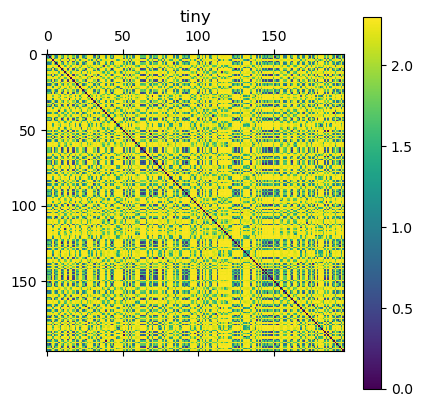

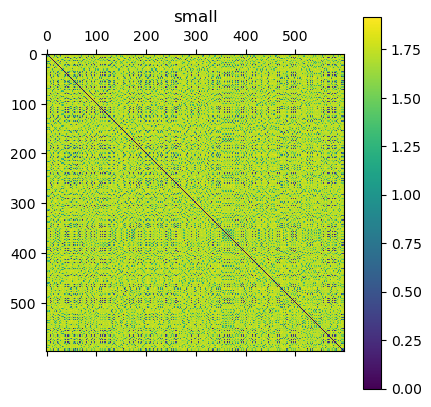

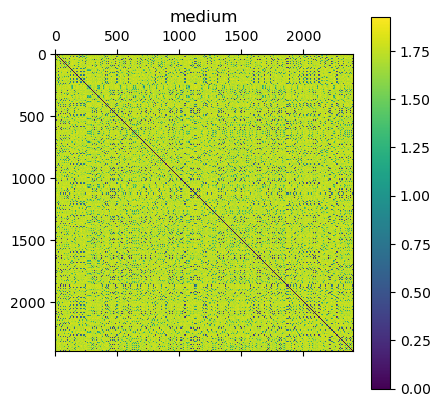

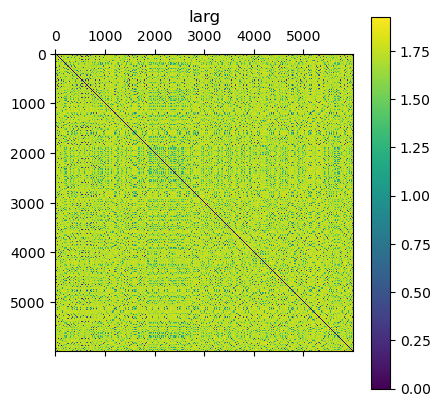

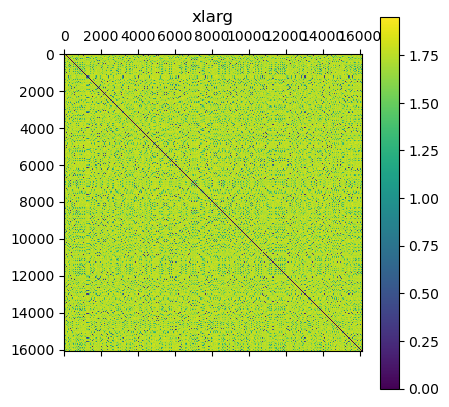

In [150]:
pca_dist_list = []
pca = PCA(2)

for i in range(len(data_list)):
    t = time()
    dist = d_mat(shift_and_norm(data_list[i]))
    
    pca_dist_list.append(pca.fit_transform(dist))
    print("Время обработки матрицы ",name_list[i]," ", (time()-t))
    plt.matshow(dist)
    plt.title(name_list[i])
    plt.colorbar()
    

#### Визуализация кластеров

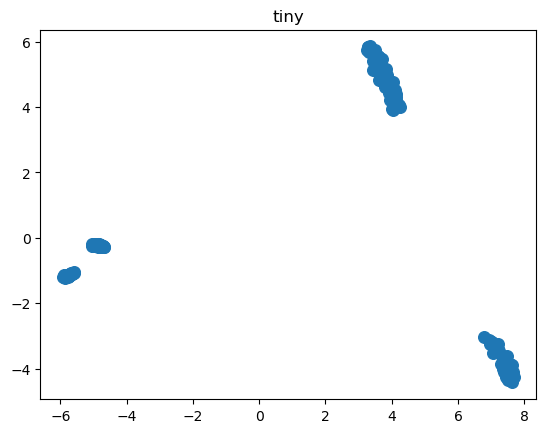

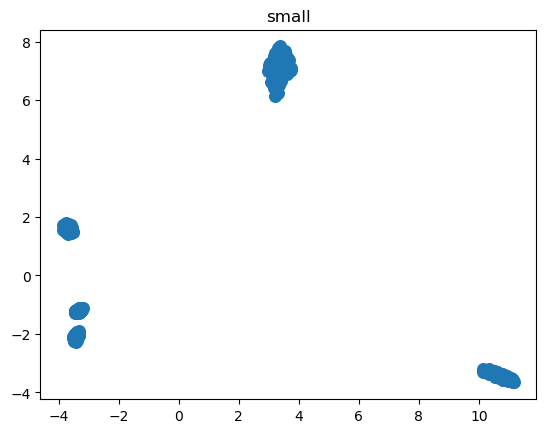

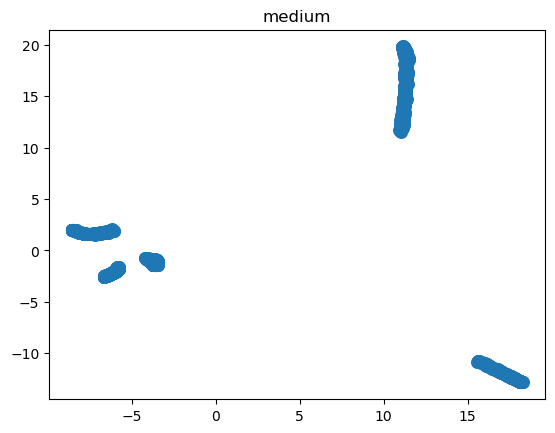

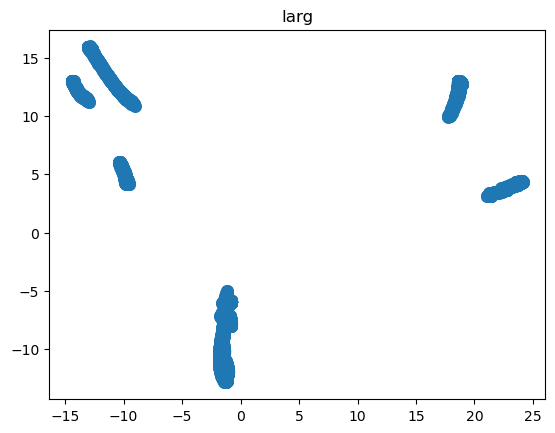

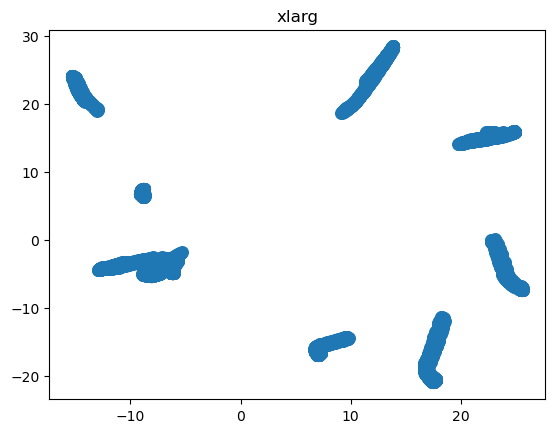

In [151]:
for i in range(len(pca_dist_list)):
    
    plt.scatter(pca_dist_list[i][:, 0], pca_dist_list[i][:, 1], s=70)
    plt.title(name_list[i])
    plt.show()

визуально определим количество кластеров

In [152]:
clasters_list = [4,5,5,6,8]

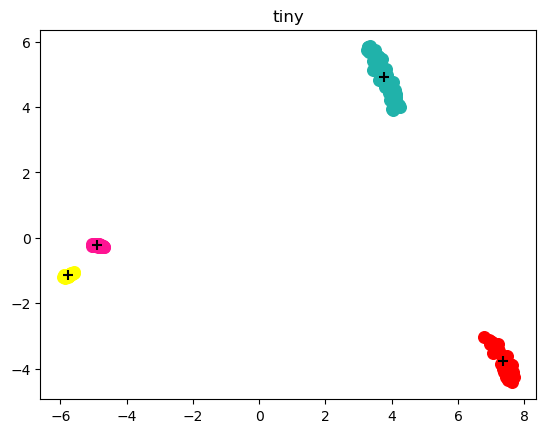

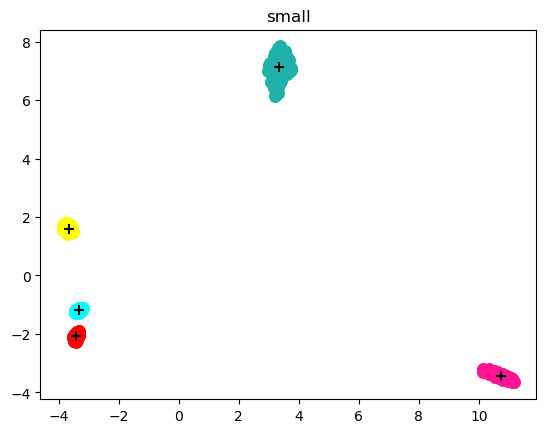

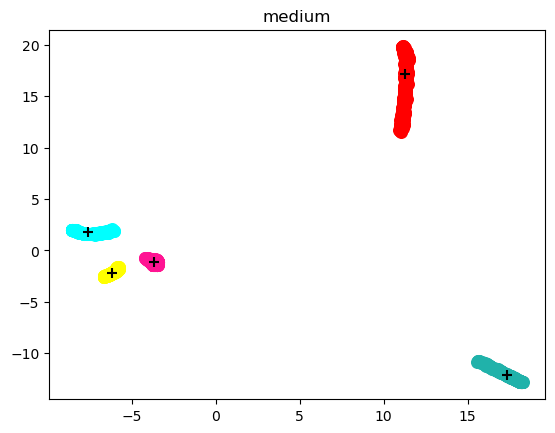

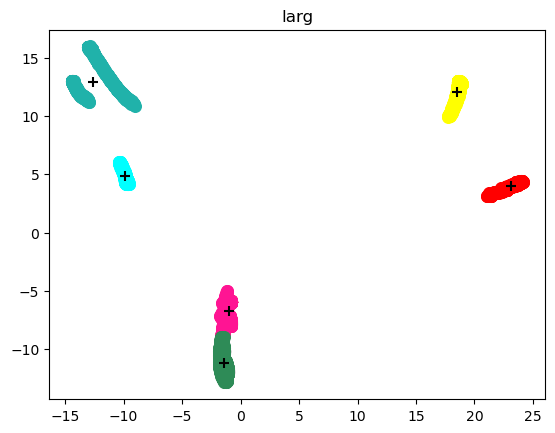

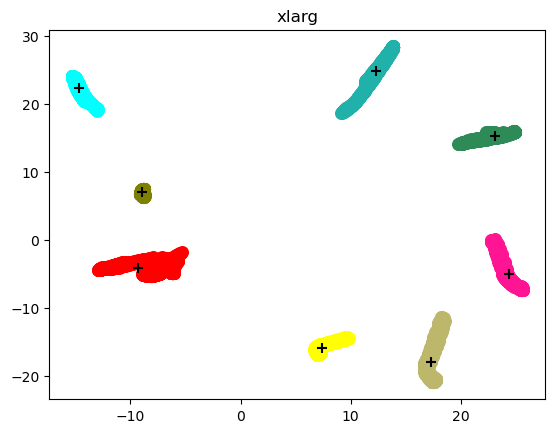

In [159]:
kmeans_list = []
color = ['#FF0000', '#FF1493', '#20B2AA', '#FFFF00', '#00FFFF','#2E8B57','#808000','#BDB76B']
for i in range(len(pca_dist_list)):
    
    kmeans = KMeans(n_clusters = clasters_list[i], init = 'k-means++')
    kmeans_list.append(kmeans.fit_predict(pca_dist_list[i]))

    
    for j in range(clasters_list[i]):
        plt.scatter(pca_dist_list[i][kmeans_list[i] == j, 0], pca_dist_list[i][kmeans_list[i] == j, 1], s=70, c=color[j], label=f'Кластер {i+1}')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=50, c='black', marker='+', label='Центроиды')
    plt.title(name_list[i])
    plt.show()

#### Визуализируем полученные кластеры на исходных данных

/var/folders/bs/dggk1c6d42gcjhstkr9c_wp00000gn/T/ipykernel_51607/4002667735.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10, 5))


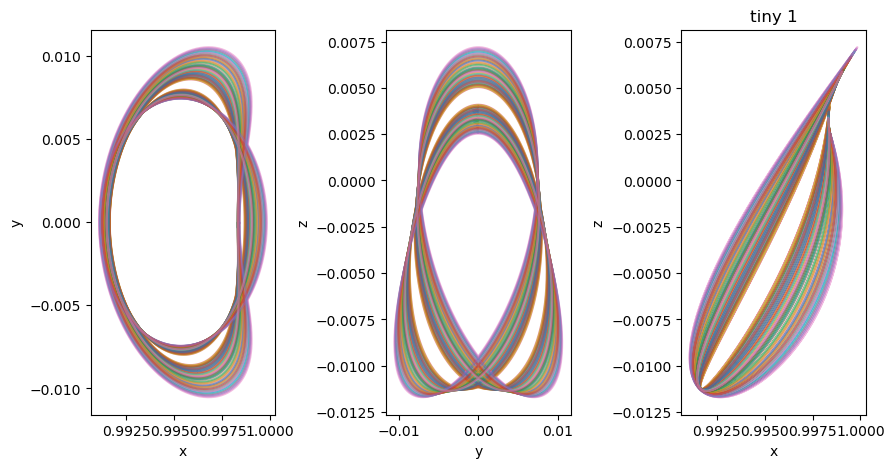

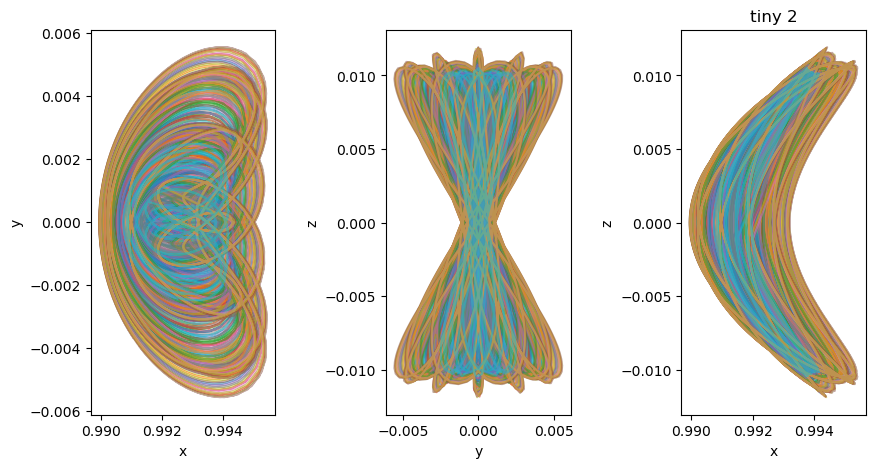

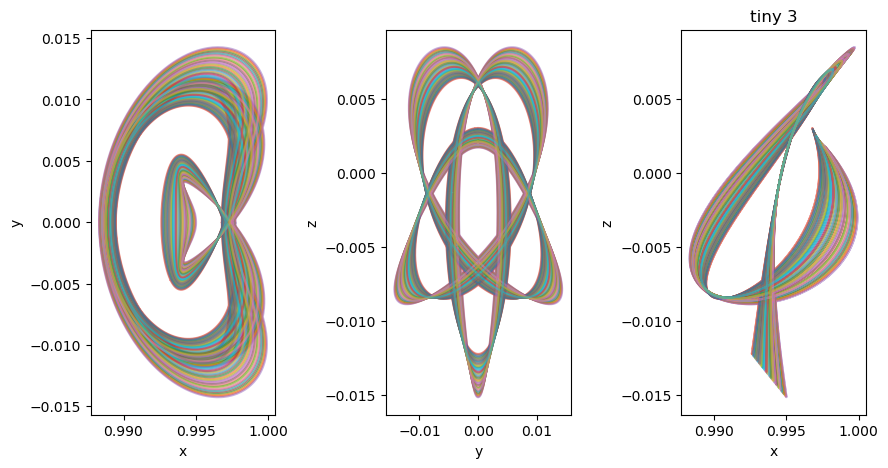

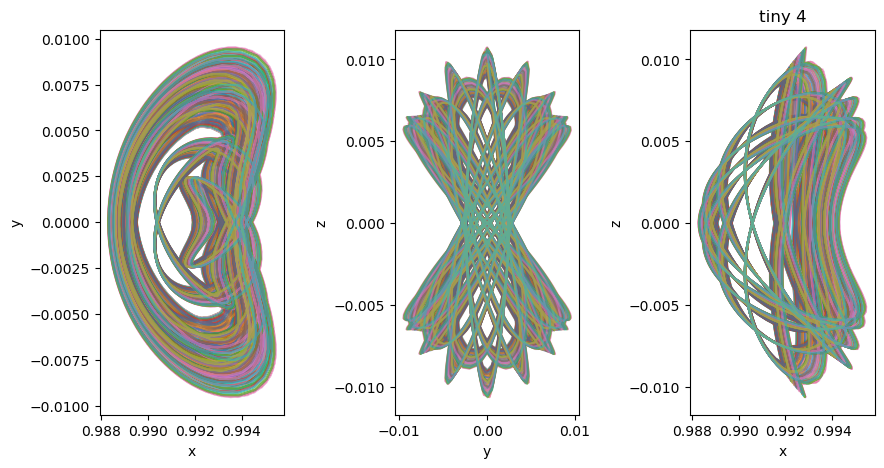

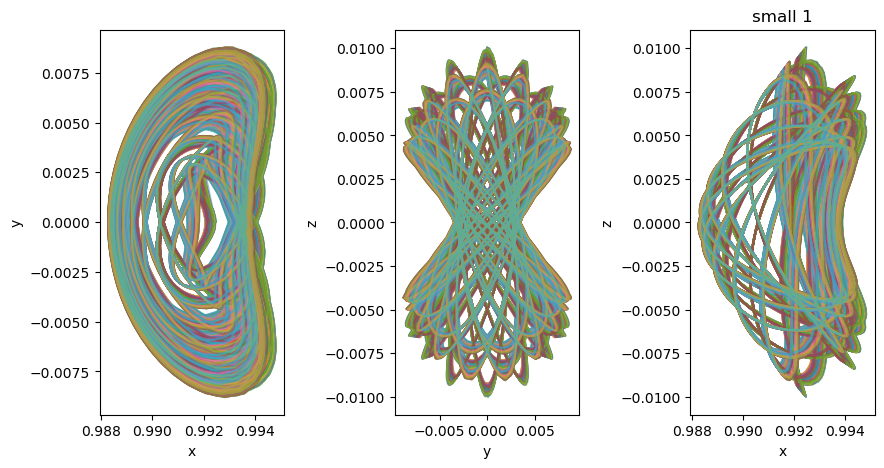

...

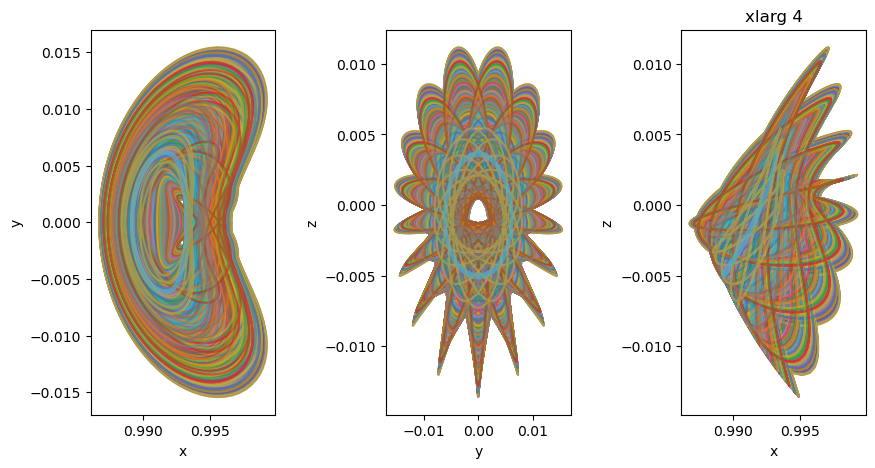

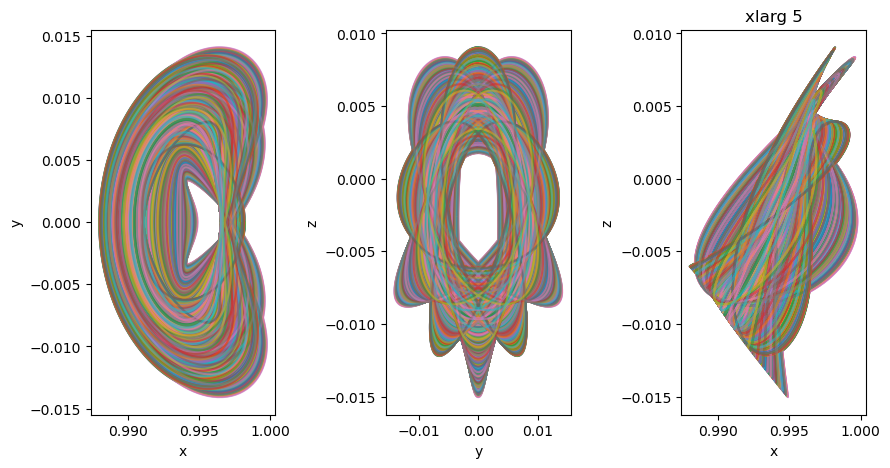

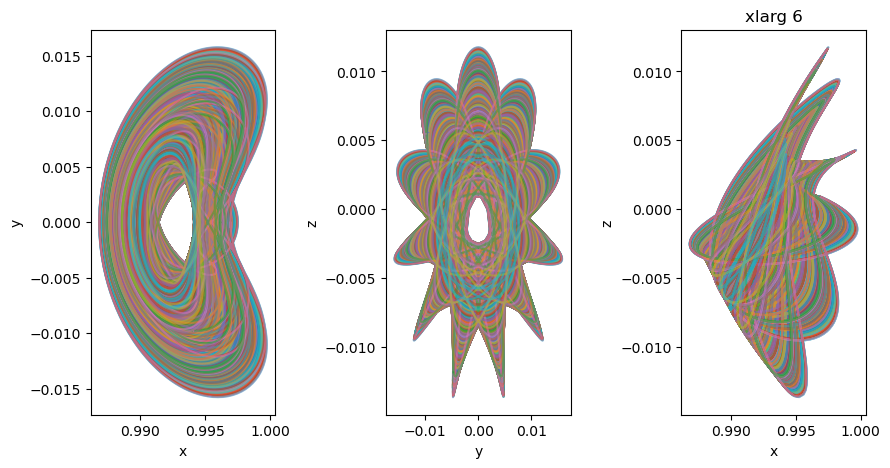

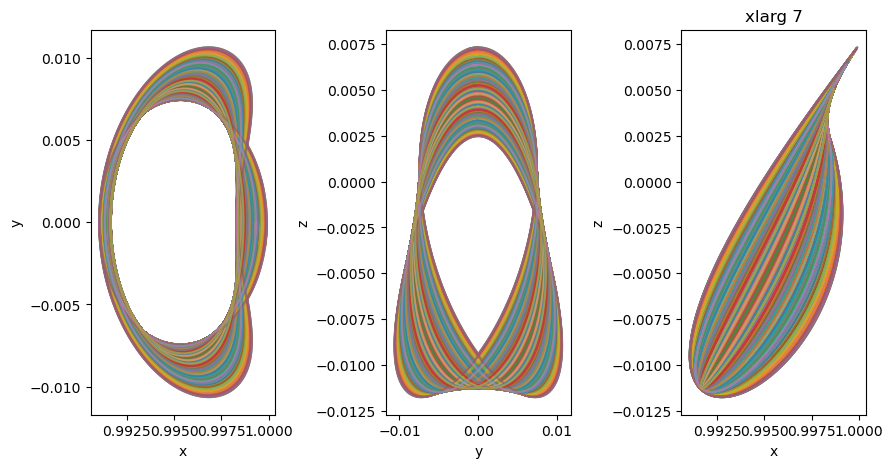

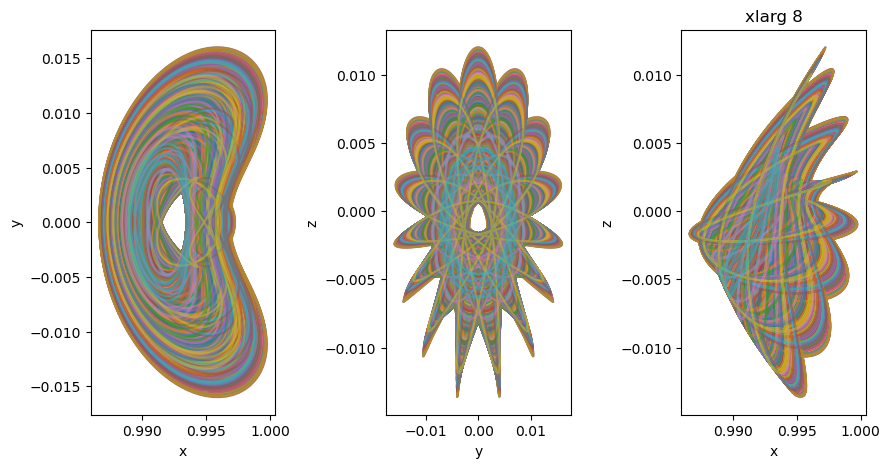

In [160]:
for j in range(len(data_list_copy)):
    
    for i in range(clasters_list[j]):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 3, 1)
        plt.plot(*data_list_copy[j][kmeans_list[j]==i, :, 0:2].T, alpha=0.5)
        plt.xlabel('x')
        plt.ylabel('y') 
        plt.subplot(1, 3, 2)
        plt.plot(*data_list_copy[j][kmeans_list[j]==i, :, 1:3].T, alpha=0.5)
        plt.xlabel('y')
        plt.ylabel('z') 
        plt.subplot(1, 3, 3)
        plt.title(name_list[j]+' '+str(i+1)) 
        plt.plot(data_list_copy[j][kmeans_list[j]==i, :, 0].T, data_list_copy[j][kmeans_list[j]==i, :, 2].T, alpha=0.5);
        plt.xlabel('x')
        plt.ylabel('z') 
          
        plt.subplots_adjust(wspace=0.6)